In [ ]:
# Create reference images in EPSG:4326
'''
!gdalwarp -of GTiff -t_srs EPSG:4326 -multi -wo NUM_THREADS=ALL_CPUS --config GDAL_CACHEMAX 16384 data/reference/ortofoto_reference_epsg32632.tif data/reference/ortofoto_reference_epsg4326.tif
!gdal_translate data/reference/ortofoto_reference_epsg4326.tif data/reference/ortofoto_reference_epsg4326_cog.tif -of COG -co COMPRESS=DEFLATE -co NUM_THREADS=ALL_CPUS -co BIGTIFF=YES --config GDAL_CACHEMAX 16384
!rm data/reference/ortofoto_reference_epsg4326.tif
!mv data/reference/ortofoto_reference_epsg4326_cog.tif data/reference/ortofoto_reference_epsg4326.tif

!gdalwarp -of GTiff -t_srs EPSG:4326 -multi -wo NUM_THREADS=ALL_CPUS --config GDAL_CACHEMAX 16384 data/reference/ortofoto_reference_epsg32632_nodata_mask.tif data/reference/ortofoto_reference_epsg4326_nodata_mask.tif
!gdal_translate data/reference/ortofoto_reference_epsg4326_nodata_mask.tif data/reference/ortofoto_reference_epsg4326_nodata_mask_cog.tif -of COG -co COMPRESS=DEFLATE -co NUM_THREADS=ALL_CPUS -co BIGTIFF=YES --config GDAL_CACHEMAX 16384
!rm data/reference/ortofoto_reference_epsg4326_nodata_mask.tif
!mv data/reference/ortofoto_reference_epsg4326_nodata_mask_cog.tif data/reference/ortofoto_reference_epsg4326_nodata_mask.tif
'''

In [1]:
'''
!export GDAL_CACHEMAX=16384
'''

In [ ]:
!python app.py --username jacobjeppesen \
               --password sentinel \
               --data_directory /workspace/mnt/app/data/output \
               --output_directory=/workspace/output_dir \
               --geojson denmark_without_bornholm \
               --satellite s1 \
               --startdate 20160701 \
               --enddate 20201031 \
               --overwrite=True \
               --move_to_output_directory=True \
               --logging_verbosity info \
               --s1_num_proc 3 \
               --s1_relative_orbit 139 \
               --s1_del_intermediate=True \
               --s1_coregister=False

I0331 20:42:31.949828 140256823879488 app.py:38] ####################################
I0331 20:42:31.950027 140256823879488 app.py:39] # Initializing Sentinel downloader #
I0331 20:42:31.950099 140256823879488 app.py:40] ####################################
I0331 20:42:31.950162 140256823879488 app.py:41] Order id: order_20210331-204231
Querying products: 100%|███████████████| 769/769 [00:36<00:00, 18.14 products/s]
I0331 20:43:48.413839 140256823879488 sentinel.py:209] Found 769 products
I0331 20:43:48.470961 140256823879488 downloader.py:133] Number of products = 769
I0331 20:43:48.472260 140256823879488 downloader.py:134] Total size [GB] = 1270.8
I0331 20:43:48.688748 140256823879488 app.py:63] 
I0331 20:43:48.688931 140256823879488 app.py:66] ####################
I0331 20:43:48.689000 140256823879488 app.py:67] # Downloading data #
I0331 20:43:48.689064 140256823879488 app.py:68] ####################
I0331 20:43:48.705267 140256823879488 downloader.py:160] Downloading Sentinel-1/2/

Bounding box of calculated footprint for reference image:
	(7.991379004455191, 54.52612444878368, 13.062654135462305, 57.77355672575578)
Bounding box of calculated footprint for image to be shifted:
	(6.472074670366905, 53.46911394465188, 12.116009937433034, 58.36385426476233)
resolutions:  0.00012338268529529252 8.983152841195215e-05
48.49 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 9.2/56.1
Original matching windows:


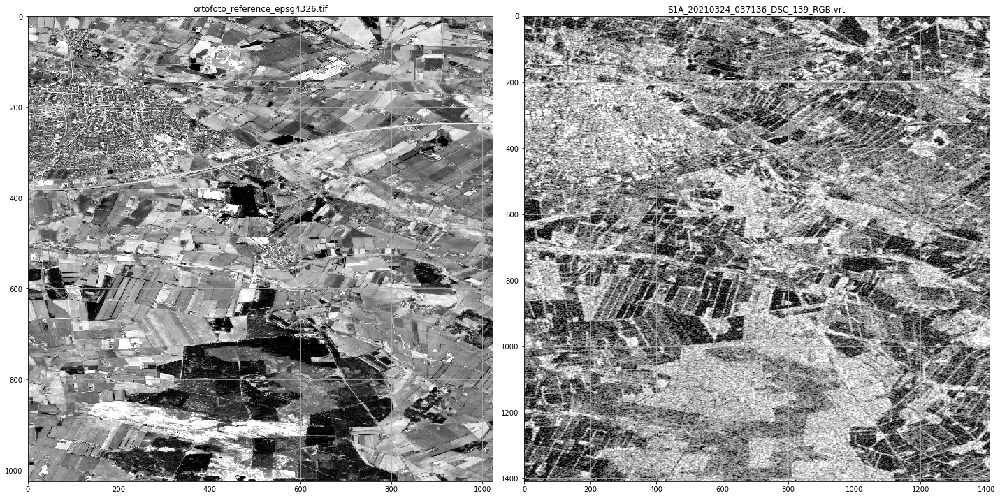

Matching windows with equalized spatial resolution:


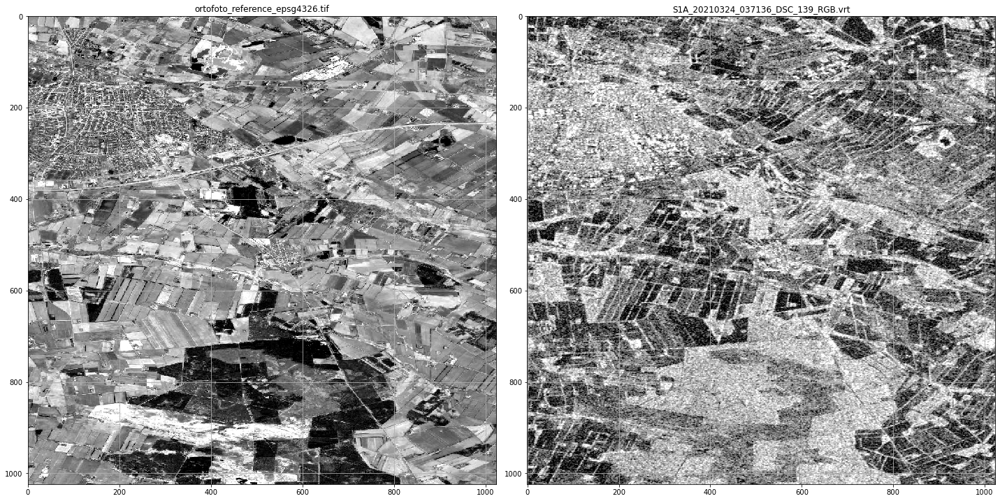

xgsd_factor 1.3734897699778685
ygsd_factor 1.3734897699778685
imfft_xgsd_mapvalues 0.00012338268529529252
imfft_ygsd_mapvalues 0.00012338268529529252
final window size: 1024/1024 (X/Y)


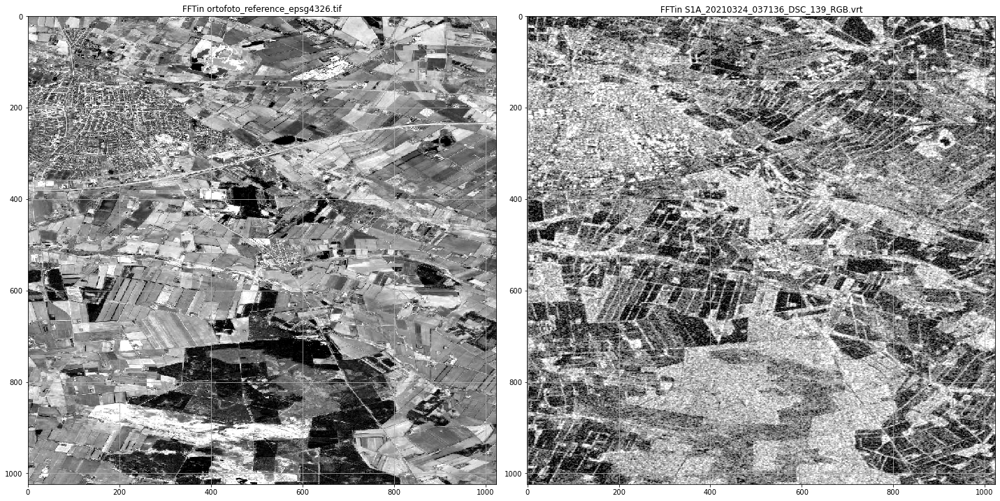

forward FFTW: 1.04s
backward FFTW: 0.02s


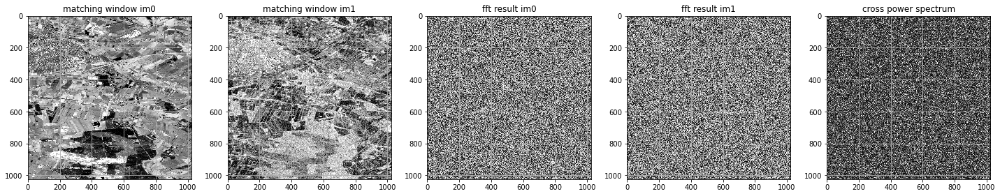

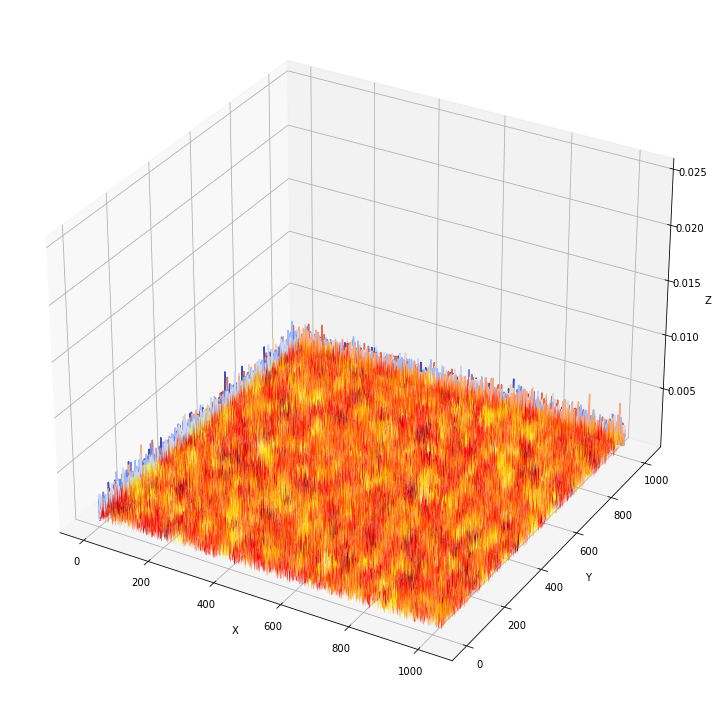

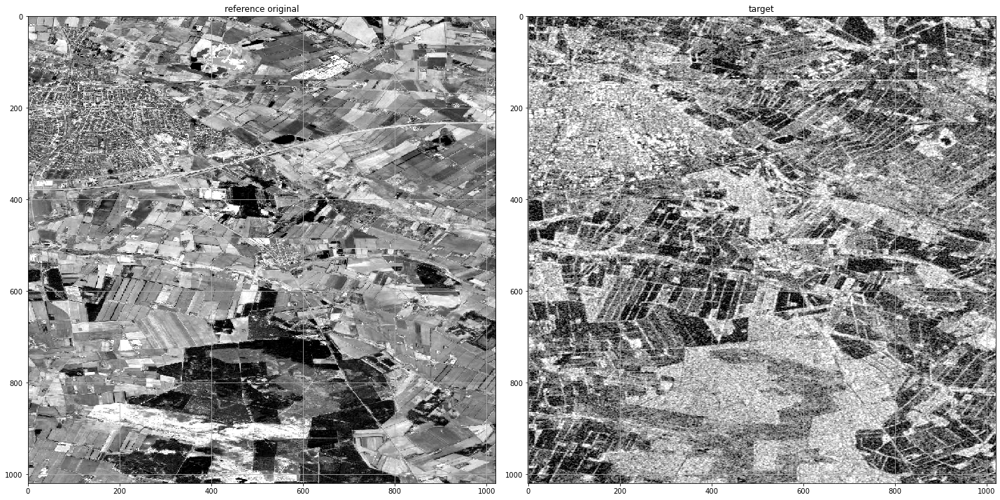

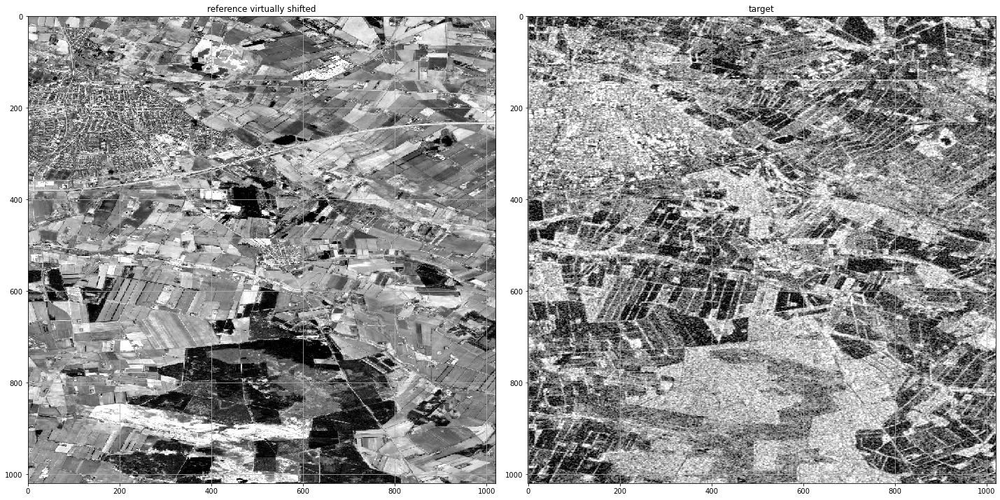

final window size: 512/512 (X/Y)


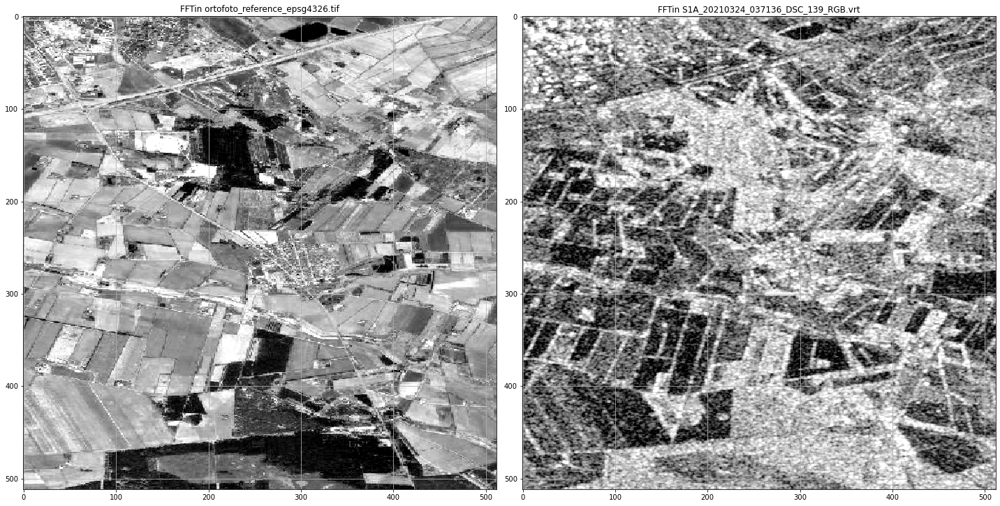

forward FFTW: 0.68s
backward FFTW: 0.00s


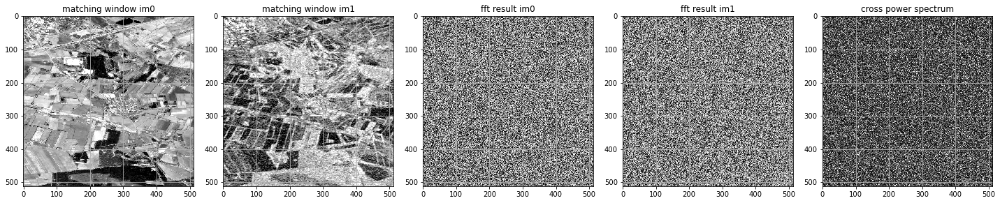

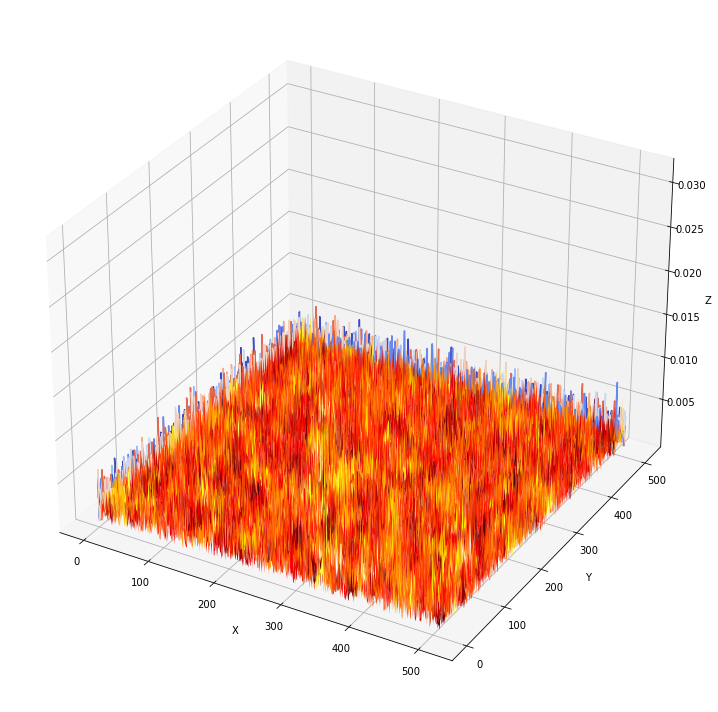

Horizontal side maximum found right. value: 0.027244120571535264
Vertical side maximum found below. value: 0.025089907509799027


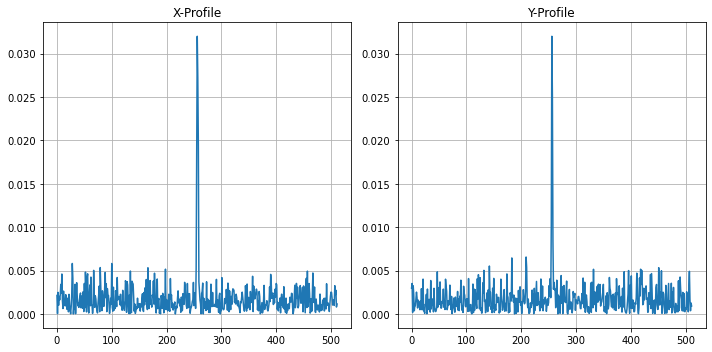

Detected integer shifts (X/Y):                            -2/-1
Detected subpixel shifts (X/Y):                           0.4598698882568645/0.43948842208538424
Calculated total shifts in fft pixel units (X/Y):         -1.5401301117431356/-0.5605115779146157
Calculated total shifts in reference pixel units (X/Y):   -1.5401301117431356/-0.5605115779146157
Calculated total shifts in target pixel units (X/Y):      -2.115352952914068/-0.7698569182198777
Calculated map shifts (X,Y):				  -0.00019002538889090204/6.915742362423316e-05
Calculated absolute shift vector length in map units:     0.00020221868772564073
Calculated angle of shift vector in degrees from North:   109.99835945958418
Original map info: ['Geographic Lat/Lon', 1.0, 1.0, 6.472074670366905, 58.36385426476233, 8.983152841195215e-05, 8.983152841195215e-05, 'WGS-84']
Updated map info:  ['Geographic Lat/Lon', 1.0, 1.0, '6.471884644978014', '58.363923422185955', 8.983152841195215e-05, 8.983152841195215e-05, 'WGS-84']
Image simil

In [ ]:
# Test the co-registration
# NOTE: You can also set "'v': False" inside the temp_coregister_function_for_elsevier_intepretability_paper() function

from arosics import COREG
from pathlib import Path
import logging

# Remember to set nodata value to 0 when saving the ortofoto
reference_im_path = Path('/workspace/mnt/app/data/reference')
im_reference = str(reference_im_path / 'ortofoto_reference_epsg4326.tif')
im_target = '/workspace/mnt/app/data/output/output_data/s1/combined/S1A_20210324_037136_DSC_139_RGB.vrt'
dst_path = '/workspace/mnt/app/data/output/output_data/s1/combined/S1A_20210324_037136_DSC_139_RGB_coreg.tif'

kwargs = {
#     'mask_baddata_ref': str(reference_im_path / 'ortofoto_reference_epsg4326_nodata_mask.tif'),
    'path_out': str(dst_path),
    'fmt_out': 'COG',
    'out_crea_options': ['COMPRESS=DEFLATE', 'NUM_THREADS=ALL_CPUS'],
    'wp': (9.20, 56.10),
    'ws': (8192, 8192),
    'nodata': (255., -32768),
    'calc_corners': False,
    'q': False,
    'v': True 
}

CR = COREG(im_reference, im_target, **kwargs)
CR.calculate_spatial_shifts()
CR.correct_shifts()
logging.info("Shift reliability is " + str(round(CR.shift_reliability, 2)) + "% for " + str(dst_path))